# **End-to-end multi-class Dog Breed Classification**

This notebook builds an end-to-end multi-class image classifier using Tensorrflow 2.0 and Tensorflow Hub.

## **1. Problem**

Identifying the breed of a dog given the image of the dog.

## **2. Data**

The data we are using is from Kaggle's Dog breed identification competition.

https://www.kaggle.com/competitions/dog-breed-identification

##**3. Evaluation**

The evaluation is a file with prediction probabilities for each dog breed of each est image.

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## **4. Features**

Some information about the data:

* We are dealing with images (unstructured data) so its probably best we use deep learning or transfer learning.

* There are 120 breeds of dogs (this means there are 120 diffeent classes).

* There are around 10k+ images in the training set (with labels) as well as in the test set (without labels).


In [2]:
# Unzipping the data into the drive.
#!unzip 'drive/MyDrive/Dog_vision_deep_learning/dog-breed-identification.zip' -d 'drive/MyDrive/Dog_vision_deep_learning/'

## **Getting workspace ready**

* Importing Tensorflow 2.x
* Import Tensorflow Hub
* Make sure we ae using a GPU.

In [9]:
# Import necessary tools.
import tf_keras
import os

import tensorflow as tf
print("TF version: ", tf.__version__)

import tensorflow_hub as hub
print("TF Hub version: ", hub.__version__)

# CHecking for GPU availability.
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

TF version:  2.17.0
TF Hub version:  0.16.1
GPU not available


## Getting our data ready ie. turning images into tensors.

With all the machine learning model, the data should be converted to numbers first. Turning our images into numerical representation.

Strat by accessing our data and checking out labels.

In [4]:
import pandas as pd
labels_csv = pd.read_csv('drive/MyDrive/Dog_vision_deep_learning/labels.csv')
print(labels_csv.describe())
labels_csv.head()

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


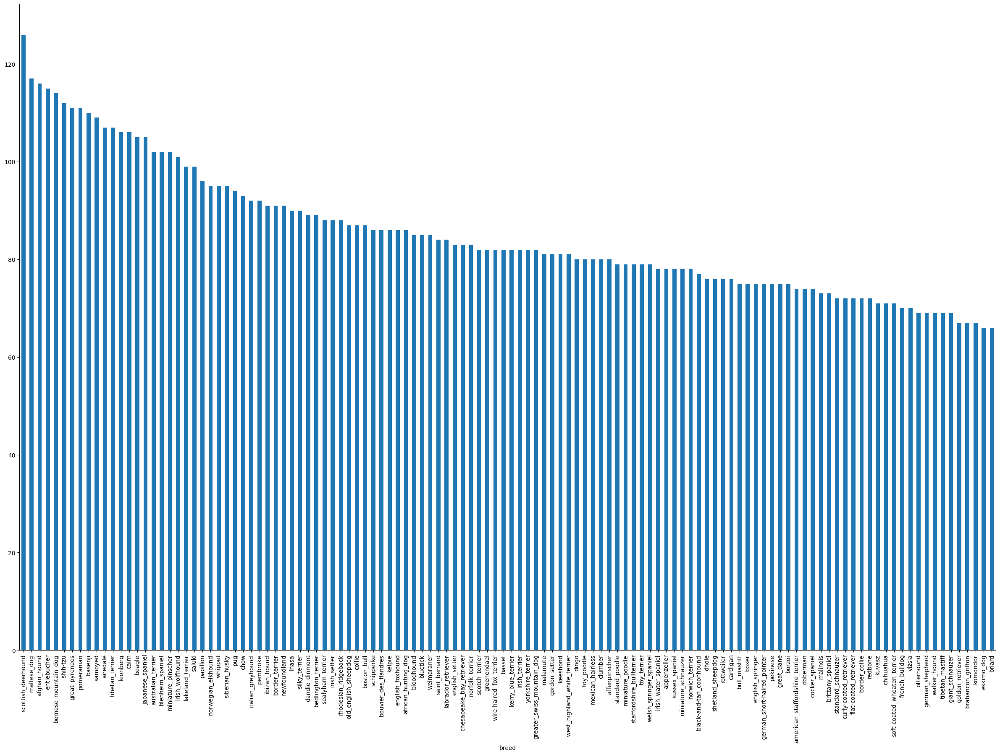

In [23]:
# How many images are there are of each breed?

labels_csv['breed'].value_counts()
labels_csv['breed'].value_counts().plot.bar(figsize = (30, 20));

In [24]:
labels_csv['breed'].value_counts().median()

82.0

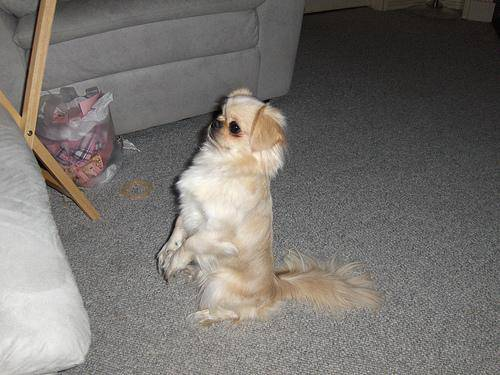

In [25]:
# Lets view an image
from IPython.display import Image
Image('drive/MyDrive/Dog_vision_deep_learning/train/001cdf01b096e06d78e9e5112d419397.jpg')

### **Getting images and their labels**
Lets get a list of all our file pathnames.

In [26]:
# Create pathnames from image IDs
filename = ['drive/MyDrive/Dog_vision_deep_learning/train/' + fname+'.jpg' for fname in labels_csv['id']]

filename[:5]

['drive/MyDrive/Dog_vision_deep_learning/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog_vision_deep_learning/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog_vision_deep_learning/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog_vision_deep_learning/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog_vision_deep_learning/train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

In [27]:
# Check weather number of filenames matches the actual numbner of image files.

import os
if len(os.listdir('drive/MyDrive/Dog_vision_deep_learning/train/')) == len(filename):
  print("Numbers are matching.")
else:
  print("Numbers arent matching.")

Numbers are matching.


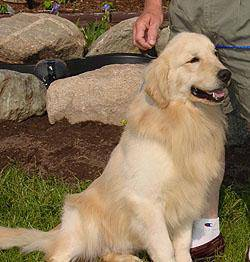

In [28]:
# One more check

Image(filename[6548])

In [29]:
labels_csv['breed'][6548]

'golden_retriever'

Since we got our training image filepaths in a list, lets prepare our labels.

In [30]:
import numpy as np
labels = labels_csv['breed'].to_numpy()
#labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [31]:
# Checking if number of labels match the number of filenames
if len(labels) == len(filename):
  print("Matching numbers.")
else:
  print("Numbers arent matching.")

Matching numbers.


In [32]:
# Find unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [33]:
# Turn a single label into an array of booleans

print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [34]:
# Turning every label into boolean values.

boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:3]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [35]:
# Turning boolean values into integers
print(labels[25])
print(boolean_labels[25].astype(int))

golden_retriever
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### **Creating our own validation set**

In [36]:
# Setup X and y variables
X = filename
y = boolean_labels

In [37]:
len(filename)

10222

We are going to start experimenting with 1000 images and increase it as needed.

In [38]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min: 1000, max:10000, step:1000}

In [39]:
# Splitting data into train and validation.
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size= 0.2,
                                                  random_state = 42)


## **Preprocessing Images (Turning images into Tensors)**

To preprocess the images into tensors we are going to write a function which does a few things :
1. Take image file path as input.
2. Use tensorflow to read the file and save it into a variable, `image`.
3. Turn our `image` (JPG file) into tensors.
4. Normalize our image (convert color channel values from 0-255 to 0-1).
5. Resize the `image` to be of shape (224, 224).
6. Return the modified `image`.

In [40]:
# Convert an image into a numpy array
from matplotlib.pyplot import imread
image = imread(filename[42])
image.shape

(257, 350, 3)

`(257, 350, 3)` gives the height, width and color channel.

In [41]:
image.max(), image.min()

(255, 0)

In [42]:
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

Making a function to preprocess these images.

In [43]:
# Define image size
IMG_SIZE = 224

# Create a function for processing the images
def process_img(image_path):
  '''
  Takes an image file path and converts them into tensors.
  '''
  # Read in an image file
  image = tf.io.read_file(image_path)

  # Turn the jpeg image into numerical tensor with 3 color channels(RGB)
  image = tf.image.decode_jpeg(image, channels = 3)

  # Convert the color channel values from 0 to 255 to 0 to 1 values.
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to our desired value.
  image = tf.image.resize(image, size = [IMG_SIZE, IMG_SIZE])

  return image

## **Turning our data into batches**

Why turn our data into batches ?

To process all 10000+ images in one go might make it difficult for fitting into the memory.

So we do abut 32 (Batch size) images at a time (Also it can be manually if required).


* In order to use jtensorflow effecrively, we need our data in the form of tensor tuples which look like this:
`(image, label)`.


In [44]:
# Create a simple function to return a tuple of tensors.
def get_image_label(image_path, label):
  '''
  Takes an image file oath name and the associated label,
  processes the image and returns a tuple of (image, label).
  '''
  image = process_img(image_path)
  return image, label

In [45]:
# Demo of the above function
(process_img(X[42]), y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

We have got a way to convert our data into tuples of tensors in the form: `(image, labels)`. Lets amke a function to turn all of our data (X & Y) into batches.

In [14]:
# Define the batch size, 32 is a good start.
BATCH_SIZE = 32

# Create a function to turn data into batches.
def create_data_batches(X, y = None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):
  '''
  Create batches of data out of image(X) and label (y) pairs.
  Shuffles the data if its training data but doesnt shuffle if its validation data.
  Also accepts test data s input (no labels).
  '''
  # If the data is a test dataset, we probably dont have labels.
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # Only filepaths (no label)
    data_batch = data.map(process_img).batch(BATCH_SIZE)
    return data_batch

  # If the data is a validation dataset, we dont need to shuffle it.
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    #  Turn filepaths and labels into tensors.
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))

    # Shuffling the pathnames and labels before maping image processor function is faster than shuffling the images.
    data = data.shuffle(buffer_size = len(X))

    # Creating a (image, label) tuple which also turns the image path into peprocessed image and then turning it into batches.
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
  return data_batch

In [72]:
# Create training and validation data batches.
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data = True)

Creating training data batches...
Creating validation data batches...


In [73]:
# Check out different attributes of our data batches.
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## **Visualizing data batches**

Our data is now in batches which might be a little hard to understand, so lets visualize them.

In [74]:
import matplotlib.pyplot as plt

# Create a function fro viewing images in a data batch.
def show_25_images(images, labels):
  '''
  Displays  aplot of 25 images and their labels from a data batch.
  '''
  # Setup the figure
  plt.figure(figsize= (20, 20))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [75]:
# Visualizing the data in the training batch.
train_image, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_image, train_labels)

Output hidden; open in https://colab.research.google.com to view.

* **Each time when we run the above code for the training batch visualization, we get different set of 25 images each time since the training data gets shuffled each time during the batch processing.**

In [76]:
# Visualizing validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

Output hidden; open in https://colab.research.google.com to view.

* **But that shuffling doesnt happen in this set because the data isnt being shuffled during batch processing.**

## **Building a model**

Before we build a model, there are a few things we need to define:
* The `input` shape (our images shape, in the form of tensors) to our model.
* The `output` shape (image labels, in the form of tensors) of our model.
* The URL of the model we want to use.

In [77]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of the model
OUTPUT_SHAPE = len(unique_breeds) # number of unique labels

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

* **TensorFlow Hub is an open repository and library for reusable machine learning.**
* A *module* is a self-contained piece of a TensorFlow graph, along with its weights and assets, that can be reused across different tasks in a process known as Transfer learning.

* **
**Transfer Learning can:**
* Train a model with smaller dataset.
* Improve generalization.
* Speed up training.
* **

* Other than TensorFlow, the other deep learning frameworks are `PyTorch hub`, `Model zoo` and `Papers with code`.
* **
We have got inputs, outputs and model ready to go.
Putting them together in Keras deep learning model.

Creating a function which:
* Takes the input shape, output shape and the model we have chosen as parameters.
* Defines the layers in a Keras model in a sequential fashion.
* Compiles the model.
* Build the model.
* Returns the model.

In [78]:
import tf_keras

# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf_keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf_keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf_keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
      optimizer=tf_keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
      metrics=["accuracy"] # We'd like this to go up
  )

  # Build the model
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting

  return model

In [79]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_2 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_2 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## **Creating Callbacks**

* Callbacks are helper functions a model can use during training to do things such as save its progress, check its progress or  stop training early if a model stops improving.

* We will create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

### **TensorBoard Callback**

To setup a tensorboard callback, we need to do 3 things:
1. Load the tensorboard notebook extension.
2. Create a tensorboard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our models training logs with the `% tensorboard` magic function.

In [80]:
# Load Tensor Board notebook extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [81]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs.
  logdir = os.path.join('drive/MyDrive/Dog_vision_deep_learning',
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf_keras.callbacks.TensorBoard(logdir)

* **Generalisation** : The ability of a machine learning model to perform well on data it hasnt seen before.

### **Early stopping callback** :
Early stopping helps stop our model from overfittoing by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [82]:
# Creating Early stopping callback
early_stopping = tf_keras.callbacks.EarlyStopping(monitor = "val_accuracy",
                                                  patience = 3)

## **Training a model (on subset of data)**

* Our first model is only gonna train on 1000 images to make sure everything is working.

In [83]:
NUM_EPOCHS = 100 #@param {type:"slider", min: 10, max:100, step:10}

Lets create a function which trains a model.

* Create a model using `create model`.
* Setup a TesorBoard callback using `create_tensorboard_callback`.
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for and callback funtions we would use.
* Return the trained model.

In [84]:
# Build a function to train and return a trained model

def train_model():
  '''
  Trains a given model and returns the trained version.
  '''
  # Create a model
  model = create_model()

  # Create a new tensorboard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])

  return model

In [85]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 211s 8s/step - loss: 4.5659 - accuracy: 0.0975 - val_loss: 3.4845 - val_accuracy: 0.2300
Epoch 2/100
25/25 [==============================] - 64s 3s/step - loss: 1.6483 - accuracy: 0.6762 - val_loss: 2.1743 - val_accuracy: 0.4950
Epoch 3/100
25/25 [==============================] - 54s 2s/step - loss: 0.5799 - accuracy: 0.9325 - val_loss: 1.6784 - val_accuracy: 0.6000
Epoch 4/100
25/25 [==============================] - 64s 3s/step - loss: 0.2587 - accuracy: 0.9837 - val_loss: 1.4776 - val_accuracy: 0.6300
Epoch 5/100
25/25 [==============================] - 64s 3s/step - loss: 0.1484 - accuracy: 0.9962 - val_loss: 1.4079 - val_accuracy: 0.6450
Epoch 6/100
25/25 [==============================] - 62s 3s/step - loss: 0.1004 - accuracy: 1.0000 - val_loss: 1.3576 - val_accuracy: 0.6700
Epoch 7/100
25/25 [==============================] - 53s 2s/

Here our model is overfitting because it is performing far better on training dataset than the validation dataset.

**Ways to prevent overfitting in deep learning neural network : **
####1. **Increase Training Data**:
* Data Augmentation: Increase the size and diversity of your training data by applying transformations like rotations, flips, cropping, or adding noise.
* Synthetic Data: Generate new data points using methods like SMOTE, GANs, or other sampling techniques.

####2. **Use Regularization Techniques**:
* L1/L2 Regularization (Weight Decay): Add penalties to large weights, which can help constrain the model and make it less prone to overfitting.
* Dropout: Randomly drop units (along with their connections) during training to prevent the network from becoming overly reliant on any single neuron.
* Early Stopping: Monitor the model’s performance on a validation set, and stop training when the performance stops improving.

####3. **Cross-Validation**:
* Use techniques like k-fold cross-validation to evaluate the model on different subsets of the training data, ensuring that the model generalizes better.

####4. **Reduce Model Complexity**:
* Simpler Architectures: Use smaller networks or fewer parameters (e.g., fewer layers or units) to reduce the model's ability to memorize the training data.
* Pruning: Remove unnecessary or redundant weights after training to simplify the model.

####5. **Batch Normalization**:
* Normalizing inputs for each layer helps to stabilize and accelerate training, while also regularizing the model to reduce overfitting.

####6. **Data Shuffling and Stratified Sampling**:
* Ensure that training data is shuffled before each epoch to avoid learning specific order dependencies.

####7. **Ensemble Learning**:
* Combine the predictions of several models (e.g., by averaging or voting) to reduce the likelihood of overfitting any single model.

####8. **Learning Rate Scheduling**:
* Dynamically reduce the learning rate during training, especially when the model reaches plateaus. This can prevent overshooting and reduce overfitting in later stages.

####9. **Transfer Learning**:
* Leverage pre-trained models, fine-tuning them on your dataset. Since the model is pre-trained on a larger dataset, it is less likely to overfit on your smaller dataset.

####10. **Use Validation and Test Sets**:
* Set aside a validation set to tune hyperparameters and monitor for overfitting during training, and a test set to evaluate final model performance.

### **Checking the tensorboard logs**

* The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog_vision_deep_learning/

Output hidden; open in https://colab.research.google.com to view.

## **Making and evaluating predictions using a trained model**

In [53]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose = 1)
predictions

NameError: name 'model' is not defined

In [54]:
predictions.shape

NameError: name 'predictions' is not defined

In [55]:
np.sum(predictions[1])

NameError: name 'predictions' is not defined

In [52]:
# First prediction
index = 1
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

NameError: name 'predictions' is not defined

* The more closer `max value of prediction` is to 1 the more accurate.
* Prediction probabilities are also known as `confidence levels`.

In [51]:
# Turn prediction probabilities into their respective label (Easier to understand).
def get_pred_label(prediction_probabilities):
  '''
  Turns an array of prediction probabilities into a label.
  '''
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

NameError: name 'predictions' is not defined

Since the validation data is batch datatype we will have to unbatch it to make predictions on the images and check it with the validation labels(the truth labels).

In [ ]:
image_ = []
labels_ = []

# Loop through unbatched data

for image, label in val_data.unbatch().as_numpy_iterator():
  image_.append(image)
  labels_.append(label)

image_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(predictions[37])

'doberman'

In [ ]:
get_pred_label(labels_[37])

'doberman'

In [ ]:
# Create a function to unbatchify a batch dataset

def unbatchify_dataset(data):
  '''
  Takes a batched dataset of (image, label) Tensors and returns separate lists of images and labels.
  '''
  images = []
  labels = []
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

In [ ]:
val_images, val_labels = unbatchify_dataset(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[90])

'affenpinscher'

In [ ]:
get_pred_label(predictions[90])

'english_foxhound'

Now we have got
* Prediction labels
* Validation labels (truth labels)
* Validation Images

### **Visualizing model predictions**

We will make a function which:
* Takes an array of pediction probabilities, an array of truth labels, an array of images and an integer.

* Convert the prediction probabilities into predicted label.

* Plot the predicted label, its predicted probability, the truth label and the target image on a single plpot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n = 1):
  '''
  View the prediction, ground truth label and image for sample n.
  '''
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot the image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong.
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                     np.max(pred_prob) * 100,
                                     true_label),
                                     color = color)

  pass

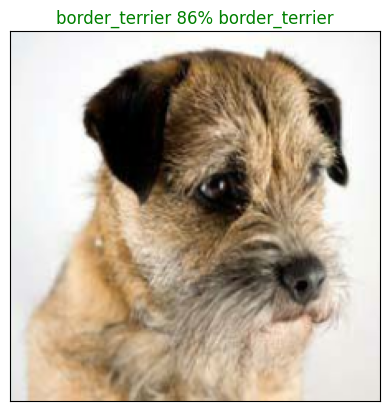

In [ ]:
plot_pred(predictions, val_labels, val_images, 56)

Another function to view our models top 10 predictions.

This function will:
* Take an input of prediction probabilities array, a ground truth array and an integer.
* Find the prediction using `get_pred_label()`.
* Find the top 10:
  * Prediction probabilities indexes.
  * Prediction predictions
  * Prediction labels.
* Plot the top 10 predictions along with their prediction probabilities and truth label.


In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n = 1):
  '''
  Plot the top 10 highest prediction confidences along with the truth laabel for sample n.
  '''
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Find the prediction label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction probabilities
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = "grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = "vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")

  pass


* The function `argsort()` returns the indices that would sort this array in ascending order. This means that the first element of the output of `argsort()` is the index of the smallest element in `predictions[0]`, the second element is the index of the second smallest element, and so on.


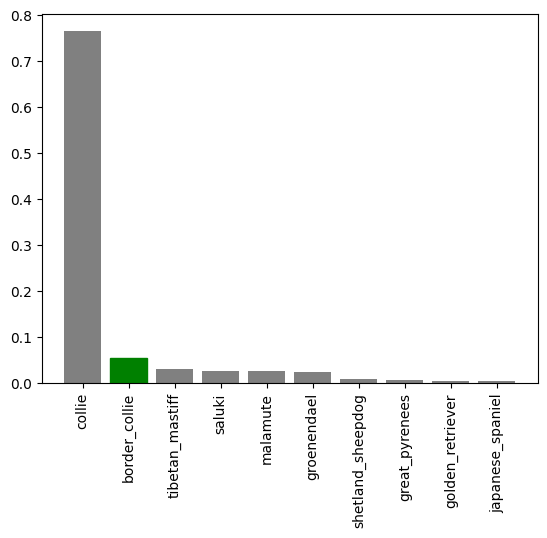

In [ ]:
plot_pred_conf(predictions, val_labels, 9)

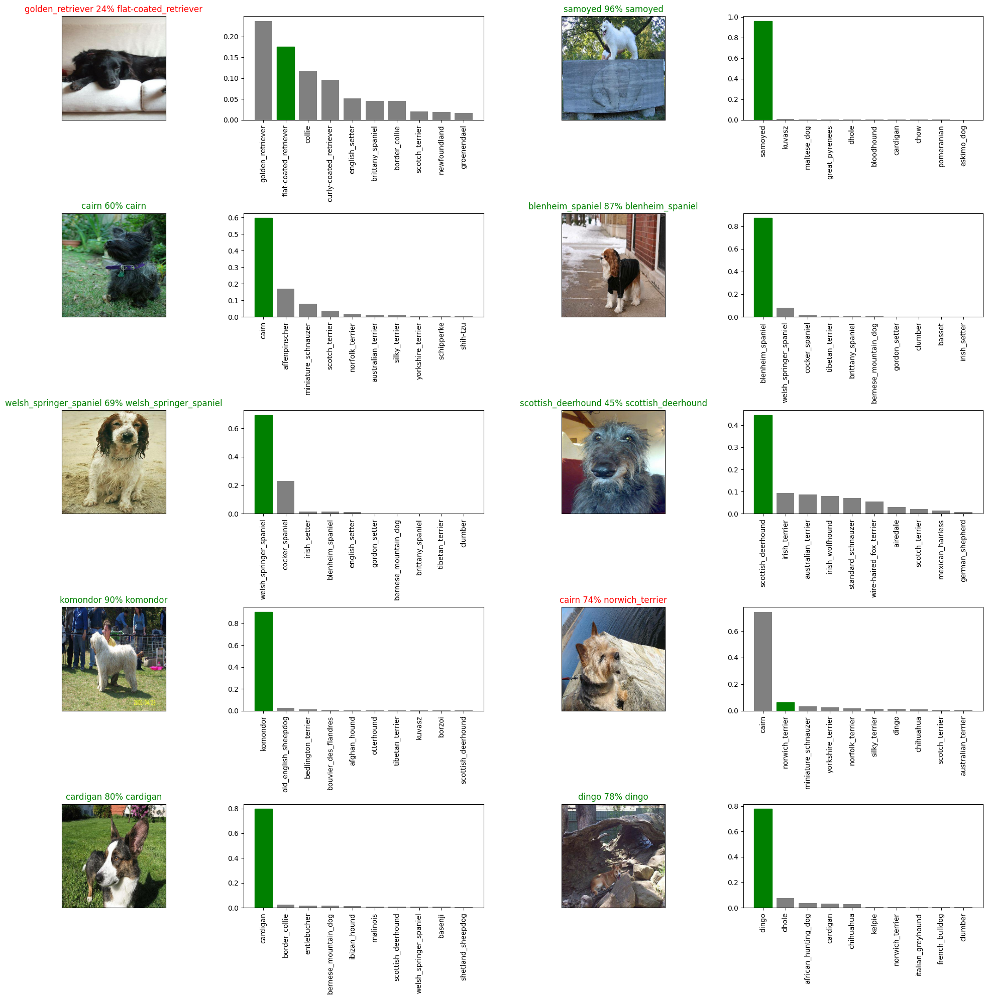

In [ ]:
# Checking out a few predictions and their different values.

i_multiplier = 20
num_rows = 5
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(20, 20))
for i in range(num_images):
  plt.subplot(num_rows, 2 * num_cols, 2 * i + 1)
  plot_pred(predictions, val_labels, val_images, i + i_multiplier)
  plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
  plot_pred_conf(predictions, val_labels, i + i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

### **Confusion Matrix**

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

# Create a confusion matrix

predicitons = model.predict(val_data, verbose = 1)
predicted_labels = [get_pred_label(prediction) for prediction in predictions]

# Compute confusion matrix
cm = confusion_matrix(val_labels, predicted_labels)
cm

7/7 [==============================] - 1s 183ms/step


array([[2, 0, 0, ..., 0, 0, 0],
       [0, 4, 0, ..., 0, 0, 0],
       [0, 0, 2, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 2, 0, 0],
       [0, 0, 0, ..., 0, 1, 0],
       [0, 0, 0, ..., 0, 0, 1]])

## **Saving and reloading a model**

In [ ]:
# Create a function to save a model.

def save_model(model, suffix = None):
  '''
  Saves a given model in a models directory and appends a suffix (str)
  for clarity.
  '''
  # Create a model directory pathname with current time
  modeldir = os.path.join('drive/MyDrive/Dog_vision_deep_learning/Models',
                          datetime.datetime.now().strftime('%Y%m%d-%H%M%s'))
  model_path = modeldir + '-' + suffix + '.h5' # save format of model
  print(f'Saving model to: {model_path}...')
  model.save(model_path)
  return model_path

In [1]:
# Create a function to load a trained model.

def load_model(model_path):
  '''
  Loads a saved model from a specified path.
  '''
  print(f'Loading saved model from: {model_path}')
  model = tf_keras.models.load_model(model_path,
                                     custom_objects = {'KerasLayer': hub.KerasLayer})
  return model

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix = '1000-images-Adam-mobilenetv2')

Saving model to: drive/MyDrive/Dog_vision_deep_learning/Models/20240925-13091727269779-1000-images-Adam-mobilenetv2.h5...


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog_vision_deep_learning/Models/20240925-13091727269779-1000-images-Adam-mobilenetv2.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model('drive/MyDrive/Dog_vision_deep_learning/Models/20240922-11461727005618-1000-images-Adam-mobilenetv2.h5')

Loading saved model from: drive/MyDrive/Dog_vision_deep_learning/Models/20240922-11461727005618-1000-images-Adam-mobilenetv2.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 104ms/step - loss: 1.2937 - accuracy: 0.6600


[1.293704628944397, 0.6600000262260437]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 142ms/step - loss: 1.2610 - accuracy: 0.6800


[1.2610126733779907, 0.6800000071525574]

## **Training a model on the full data**

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
X[:10]

['drive/MyDrive/Dog_vision_deep_learning/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog_vision_deep_learning/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog_vision_deep_learning/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog_vision_deep_learning/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog_vision_deep_learning/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog_vision_deep_learning/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog_vision_deep_learning/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog_vision_deep_learning/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog_vision_deep_learning/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog_vision_deep_learning/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
len(X_train)

800

In [ ]:
# Create a data batch with the full dataset
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model

full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all data, so we cant monitor validation accuracy.
# Create early stopping callback
full_model_early_stopping = tf_keras.callbacks.EarlyStopping(monitor = "accuracy",
                                                             patience = 3)

In [ ]:
# Fit the full model to the full data
full_model.fit(x = full_data,
               epochs = NUM_EPOCHS,
               callbacks = [full_model_tensorboard, full_model_early_stopping])

In [ ]:
save_model(full_model, suffix = 'all-images-Adam-mobilenetv2')

Saving model to: drive/MyDrive/Dog_vision_deep_learning/Models/20240924-11511727178703-all-images-Adam-mobilenetv2.h5...


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog_vision_deep_learning/Models/20240924-11511727178703-all-images-Adam-mobilenetv2.h5'

In [7]:
loaded_full_model = load_model('drive/MyDrive/Dog_vision_deep_learning/Models/20240924-11511727178703-all-images-Adam-mobilenetv2.h5')

Loading saved model from: drive/MyDrive/Dog_vision_deep_learning/Models/20240924-11511727178703-all-images-Adam-mobilenetv2.h5


## **Making predictions on test dataset**

Since the model has been trained on images in the form of Tensor Batches, the test data should also be converted to the same for predictions to be made.

TO make predictions on the test data :
* Get the test image filenames.
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` since the test data doesnt have any parameters.
* Make predictions array by passing the test batches to the `predict()` method called on our model.

In [ ]:
# Load test image filenames

test_path = 'drive/MyDrive/Dog_vision_deep_learning/test'
test_filenames = [test_path + '/' + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog_vision_deep_learning/test/e0d85c8c8730c81e80ff2ca74bb61c87.jpg',
 'drive/MyDrive/Dog_vision_deep_learning/test/e527455253416f809a73886b6003020d.jpg',
 'drive/MyDrive/Dog_vision_deep_learning/test/e57820007fcc2a07a5230177965a0f59.jpg',
 'drive/MyDrive/Dog_vision_deep_learning/test/e24b2d063b3ad699d5eba7a01e4ae956.jpg',
 'drive/MyDrive/Dog_vision_deep_learning/test/dfa54e85c1309d8a9933deedc1d775c7.jpg',
 'drive/MyDrive/Dog_vision_deep_learning/test/e421e13d0d4c977ab89fa9965221809c.jpg',
 'drive/MyDrive/Dog_vision_deep_learning/test/e265af5e8f446888c6e7ec31f803d63e.jpg',
 'drive/MyDrive/Dog_vision_deep_learning/test/de9a61a532241cff14e732f43b646d9a.jpg',
 'drive/MyDrive/Dog_vision_deep_learning/test/e30a97eb637239e3b15c903529e04800.jpg',
 'drive/MyDrive/Dog_vision_deep_learning/test/e4f8465214c9644b10c536ecb087b7be.jpg']

In [ ]:
 # Create test data batches
 test_data = create_data_batches(test_filenames, test_data = True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note :** The prediction on full model will take about an hour.

In [ ]:
# Making predictions on test data batch using the loaded full model.
test_predictions = loaded_full_model.predict(test_data, verbose = 1)

324/324 [==============================] - 722s 2s/step


In [ ]:
# Save predictions (NumPy array) to csv file
np.savetxt('drive/MyDrive/Dog_vision_deep_learning/test_predictions.csv', test_predictions, delimiter=',')

In [ ]:
# Load predictions
test_predictions = np.loadtxt('drive/MyDrive/Dog_vision_deep_learning/test_predictions.csv', delimiter=',')

In [ ]:
test_predictions[:10]

array([[4.02859024e-10, 3.71275405e-07, 9.16943144e-09, ...,
        2.81469670e-09, 4.74184129e-11, 4.07117930e-08],
       [1.02760912e-13, 6.32506158e-07, 1.10874747e-10, ...,
        5.17971291e-11, 2.75418490e-11, 3.74519128e-13],
       [3.56522147e-12, 1.78719081e-10, 1.05661011e-13, ...,
        8.58180887e-11, 1.63519254e-10, 2.12113313e-12],
       ...,
       [5.79682892e-05, 6.18493214e-05, 5.97636571e-08, ...,
        1.89360264e-07, 3.98957491e-06, 1.66888952e-07],
       [4.61479969e-04, 3.00280489e-09, 7.97536526e-09, ...,
        2.52714134e-08, 6.40834261e-11, 6.78385654e-03],
       [5.75942583e-09, 4.12229895e-09, 4.80807039e-09, ...,
        2.25070202e-08, 9.30050987e-08, 4.98452191e-12]])

In [ ]:
test_predictions.shape

(10357, 120)

## **Preparing test datset predicitons for Kaggle**

Looking at Kaggle sample submission, we find the it wants the model prediction probabilty outputs in a DataFrame with an ID and a column for each dog breed.

To get the data in this format:
* Create a pandas Dataframe with an ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image IDs from their file paths.
* Add data (prediction probabilities) to each of the dog breed columns.
* Export the df as a csv.

In [ ]:
# Create a pandas dataframe with empty columns.
preds_df = pd.DataFrame(columns = ['id'] + list(unique_breeds))
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# append test image ID's to prediction Dataframe
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df['id'] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e0d85c8c8730c81e80ff2ca74bb61c87,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e527455253416f809a73886b6003020d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e57820007fcc2a07a5230177965a0f59,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e24b2d063b3ad699d5eba7a01e4ae956,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,dfa54e85c1309d8a9933deedc1d775c7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to the dataframe
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e0d85c8c8730c81e80ff2ca74bb61c87,4.028590e-10,3.712754e-07,9.169431e-09,4.865531e-09,2.646061e-08,3.026401e-12,4.911971e-11,3.211282e-11,2.433409e-09,...,1.680865e-08,4.522029e-12,1.034853e-10,5.905371e-11,2.331471e-10,1.464491e-12,1.277331e-10,2.814697e-09,4.741841e-11,4.071179e-08
1,e527455253416f809a73886b6003020d,1.027609e-13,6.325062e-07,1.108747e-10,5.935145e-09,9.514827e-13,9.134428e-07,2.342833e-08,6.489898e-09,3.192320e-08,...,1.671310e-11,1.778479e-12,1.105869e-09,1.696632e-06,8.326828e-08,5.047567e-12,2.639444e-12,5.179713e-11,2.754185e-11,3.745191e-13
2,e57820007fcc2a07a5230177965a0f59,3.565221e-12,1.787191e-10,1.056610e-13,6.554420e-12,2.373710e-11,5.967585e-11,4.313369e-11,1.591541e-10,1.342260e-08,...,1.210747e-13,5.339704e-12,3.563975e-13,1.475469e-09,1.450248e-11,9.999291e-01,7.367766e-10,8.581809e-11,1.635193e-10,2.121133e-12
3,e24b2d063b3ad699d5eba7a01e4ae956,1.953793e-08,1.309987e-06,3.119892e-07,2.287028e-07,4.633391e-07,1.032754e-09,3.713742e-06,1.381068e-10,1.172726e-09,...,5.823582e-10,2.289547e-11,8.818571e-09,1.507316e-07,5.574816e-08,1.311751e-10,2.549036e-10,1.762690e-07,5.040352e-06,2.681559e-08
4,dfa54e85c1309d8a9933deedc1d775c7,2.101772e-06,3.188289e-07,8.425309e-11,5.339248e-10,1.682867e-08,2.191635e-12,3.890477e-14,7.280321e-12,3.616785e-13,...,4.242541e-09,2.077706e-13,6.798519e-12,2.955589e-10,7.305860e-12,3.218548e-13,1.271026e-13,8.878348e-12,8.621988e-10,4.437734e-11


In [ ]:
# Saving our predictions dataframe to csv
preds_df.to_csv('drive/MyDrive/Dog_vision_deep_learning/full_model_predictions.csv', index = False)

## **Making predictions on custom images**

To make predictions on custom images, we will:
* Get the filepaths of our own images.
* Turn the filepaths into data batches uaing `create_data_batches()`. Since our custom images wont have labels, we set `test_data` parameter to `True`.
* Pass the custom image data baych to pur model's `predict()` methos.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images.

In [11]:
# Get the custom image file path
custom_path = 'drive/MyDrive/Dog_vision_deep_learning/Custom test images'
custom_image_paths = [custom_path + '/' + fname for fname in os.listdir(custom_path)]

In [12]:
custom_image_paths

['drive/MyDrive/Dog_vision_deep_learning/Custom test images/images.jpeg',
 'drive/MyDrive/Dog_vision_deep_learning/Custom test images/belgian-malinois-dog-breed-info.jpg',
 'drive/MyDrive/Dog_vision_deep_learning/Custom test images/265_gsd.jpg']

In [46]:
# Turn custom images into batch dataset
custom_data = create_data_batches(custom_image_paths, test_data = True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [47]:
# Make predictions on custom data
custom_data_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 3s 3s/step


In [49]:
custom_data_preds.shape

(3, 120)

In [86]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_data_preds[i]) for i in range(len(custom_data_preds))]
custom_pred_labels

['doberman', 'malinois', 'german_shepherd']

In [87]:
# Get custom images ('unbatchify() wont work as there are no labels.)
custom_images = []

# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

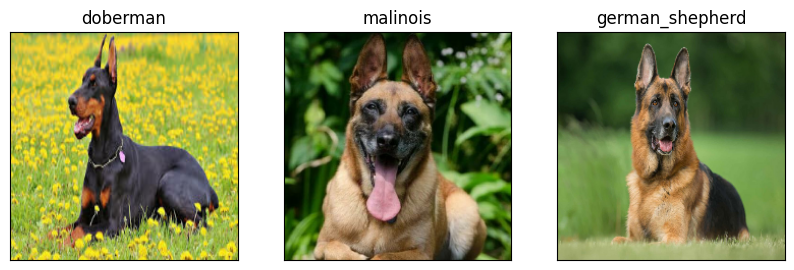

In [89]:
# Check custom predictions
plt.figure(figsize = (10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i + 1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)